In [ ]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 24.2 MB/s eta 0:00:00


**Imports and utility functions**

In [ ]:
# Import necessary libraries
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
from skimage.filters import threshold_otsu, threshold_local

def load_and_resize_images(image_paths, target_size=(512, 512)):
    images = []
    for path in image_paths:
        with rasterio.open(path) as src:
            img = src.read()  # (C, H, W)
            img = np.moveaxis(img, 0, -1)  # Convert to (H, W, C)
            img_resized = cv2.resize(img, target_size, interpolation=cv2.INTER_LINEAR)
            img_resized = np.moveaxis(img_resized, -1, 0)  # Convert back to (C, H, W)
            img_resized = img_resized.astype(np.float32) / np.max(img_resized)  # Normalize
            images.append(img_resized)
    return np.array(images)


**Change Detection & Thresholding**

In [ ]:
def compute_change_map(before_img, after_img):
    diff = np.abs(before_img - after_img)

    # Convert multi-channel difference map to grayscale
    if diff.ndim == 3:
        change_map = np.mean(diff, axis=0)
    elif diff.ndim == 2:
        change_map = diff
    else:
        raise ValueError(f"Unexpected shape {diff.shape} for diff array.")

    return change_map

def apply_thresholding(change_map):
    otsu_thresh = threshold_otsu(change_map)
    binary_map = change_map > otsu_thresh

    local_thresh = threshold_local(change_map, block_size=35, method='mean')
    adaptive_binary_map = change_map > local_thresh

    return binary_map.astype(np.uint8), adaptive_binary_map.astype(np.uint8)


**Visualization Functions**

In [ ]:
def visualize_change(before_img, after_img, change_map, binary_map, adaptive_map, title="Change Detection"):

    fig, axes = plt.subplots(1, 5, figsize=(20, 5))

    # Convert (C, H, W) → (H, W, C) for RGB images
    if before_img.ndim == 3:
        before_img = np.moveaxis(before_img, 0, -1)
    if after_img.ndim == 3:
        after_img = np.moveaxis(after_img, 0, -1)

    axes[0].imshow(before_img)
    axes[0].set_title("Before Image")

    axes[1].imshow(after_img)
    axes[1].set_title("After Image")

    axes[2].imshow(change_map, cmap='coolwarm')
    axes[2].set_title("Change Map")

    axes[3].imshow(binary_map, cmap='gray')
    axes[3].set_title("Otsu's Threshold")

    axes[4].imshow(adaptive_map, cmap='gray')
    axes[4].set_title("Adaptive Threshold")

    for ax in axes:
        ax.axis("off")
    plt.show()

def plot_statistics(change_map):

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Histogram
    sns.histplot(change_map.flatten(), bins=50, kde=True, ax=axes[0])
    axes[0].set_title("Histogram of Change Intensities")

    # Boxplot
    sns.boxplot(x=change_map.flatten(), ax=axes[1])
    axes[1].set_title("Boxplot of Change Intensities")

    # Heatmap
    sns.heatmap(change_map, cmap="coolwarm", ax=axes[2], cbar=True)
    axes[2].set_title("Heatmap of Change Regions")

    plt.show()


**Main Execution**

Processing Image Pair 1/13


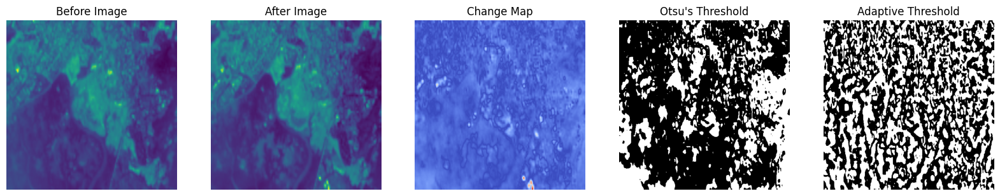

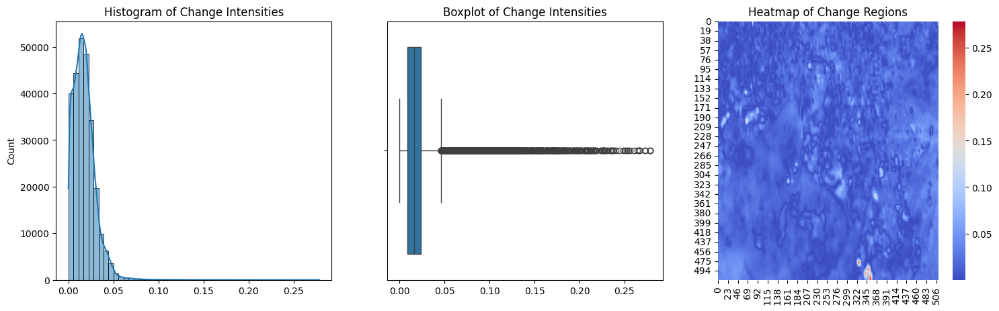

Processing Image Pair 2/13


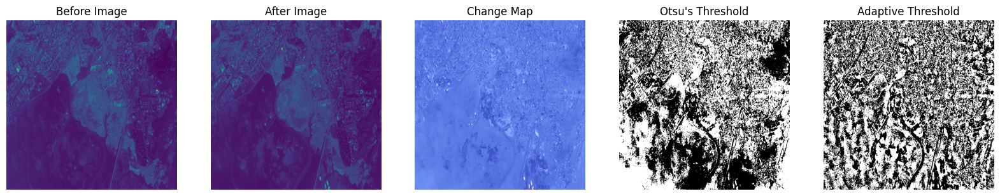

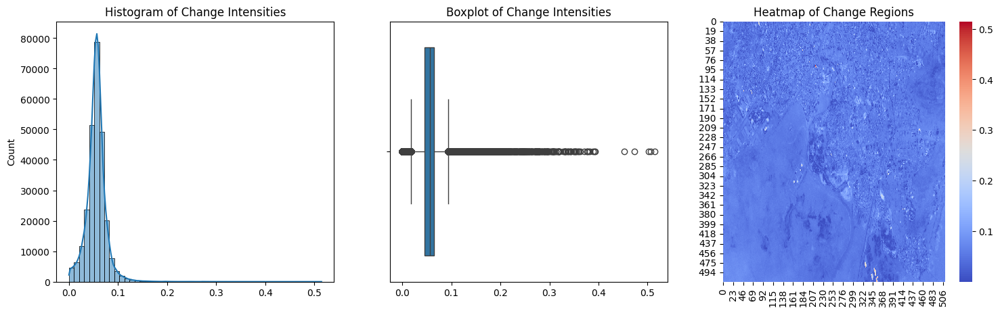

Processing Image Pair 3/13


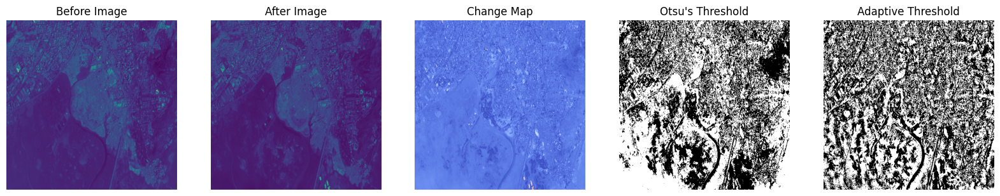

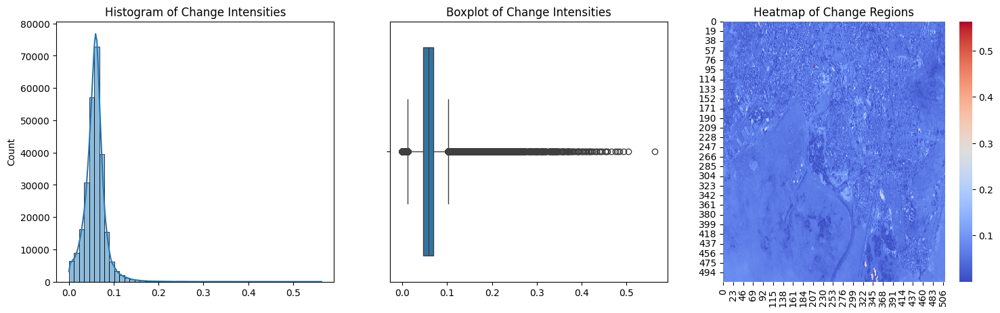

Processing Image Pair 4/13


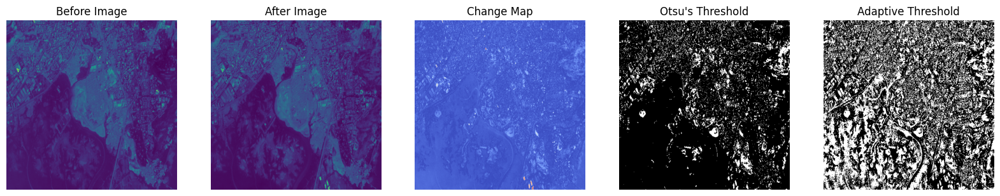

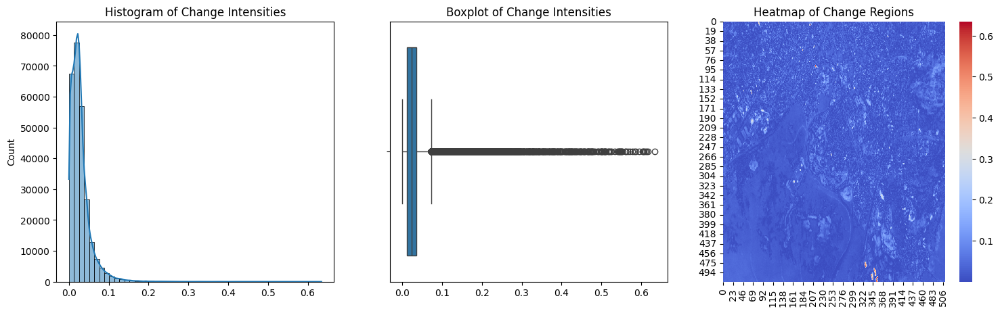

Processing Image Pair 5/13


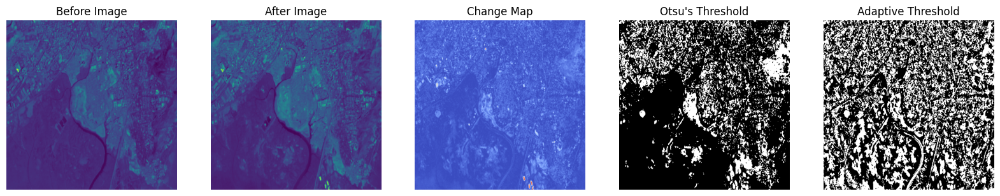

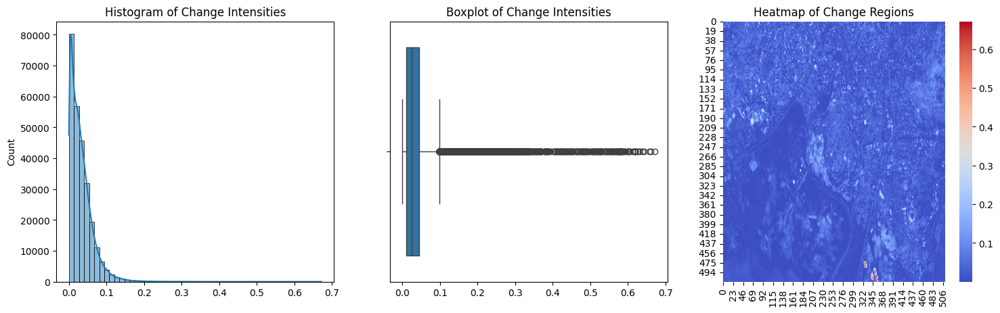

Processing Image Pair 6/13


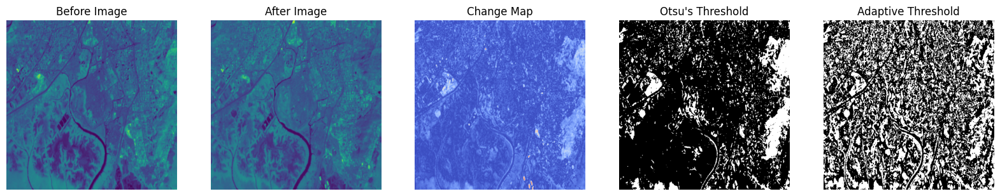

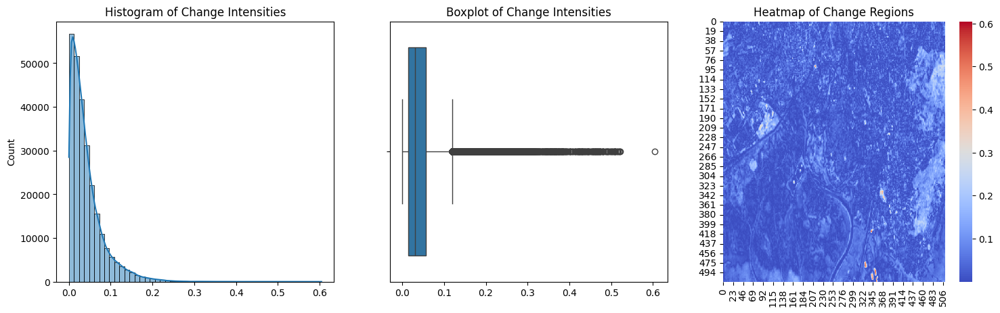

Processing Image Pair 7/13


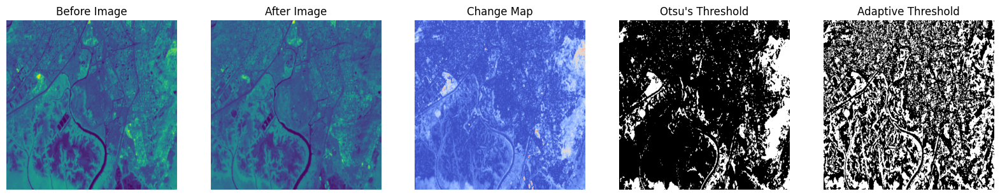

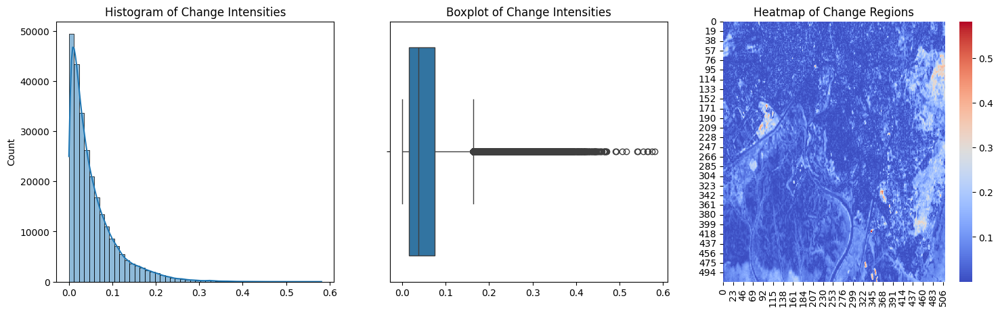

Processing Image Pair 8/13


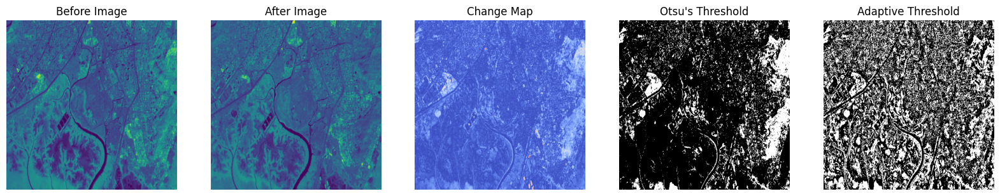

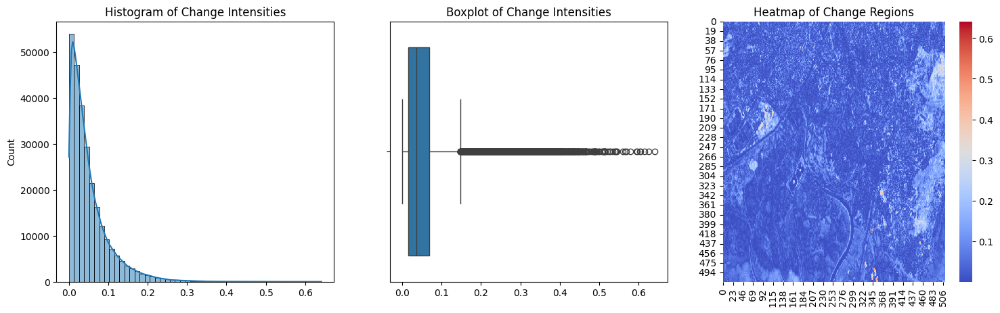

Processing Image Pair 9/13


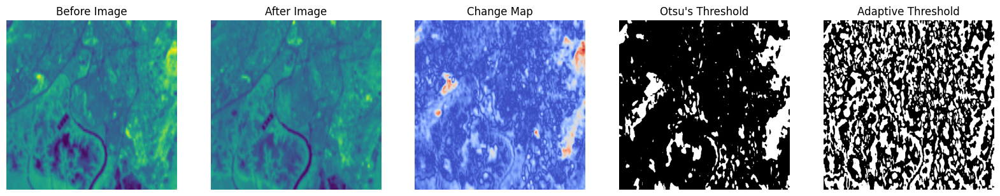

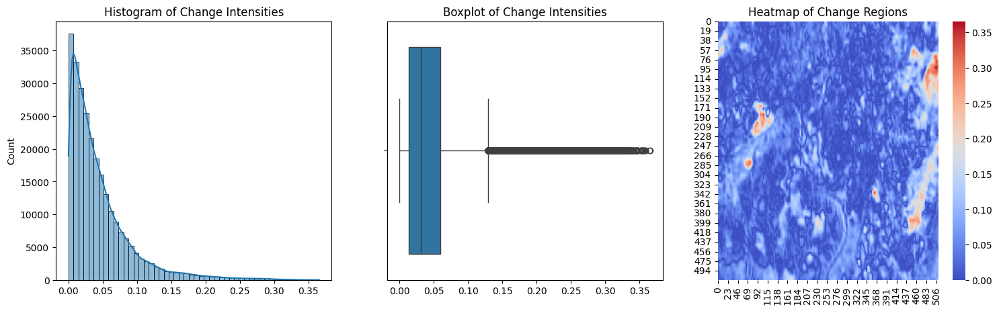

Processing Image Pair 10/13


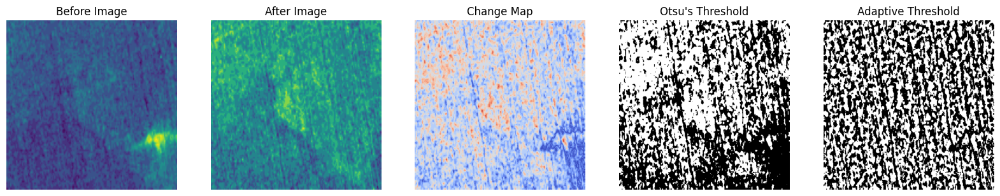

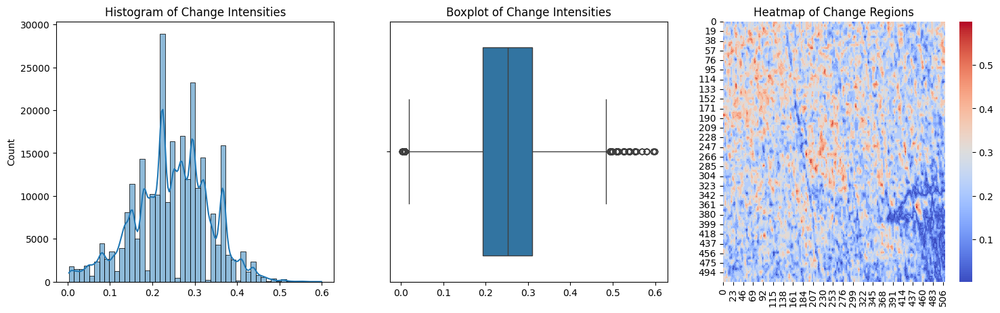

Processing Image Pair 11/13


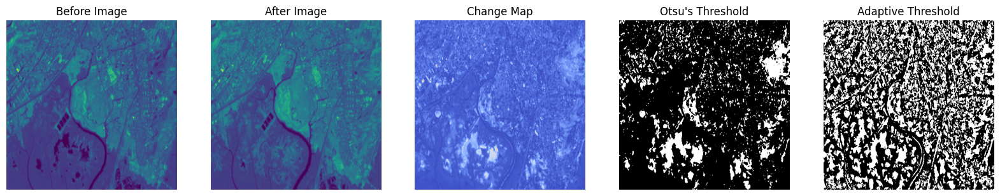

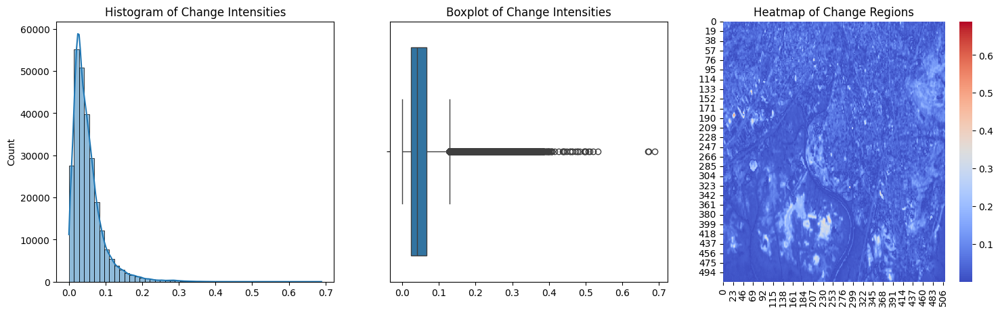

Processing Image Pair 12/13


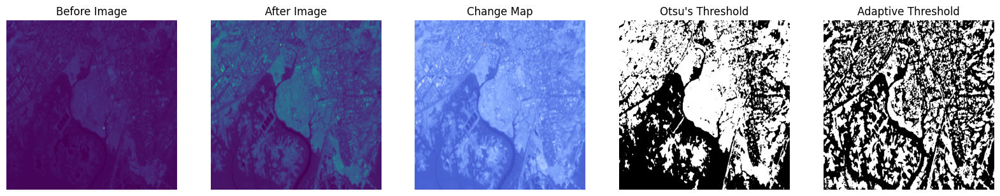

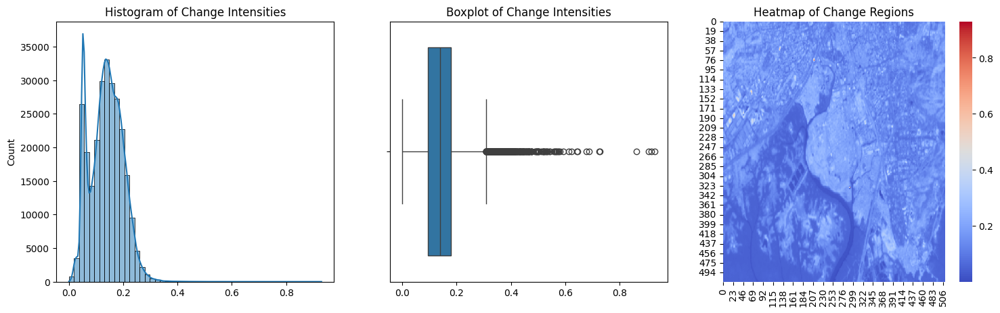

Processing Image Pair 13/13


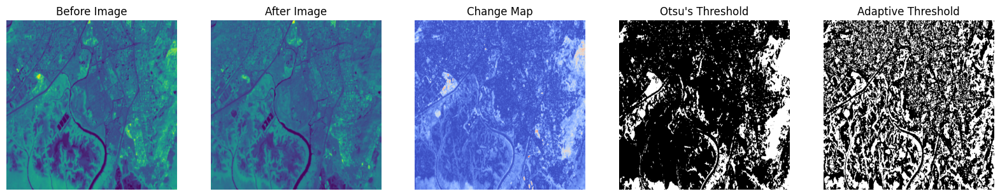

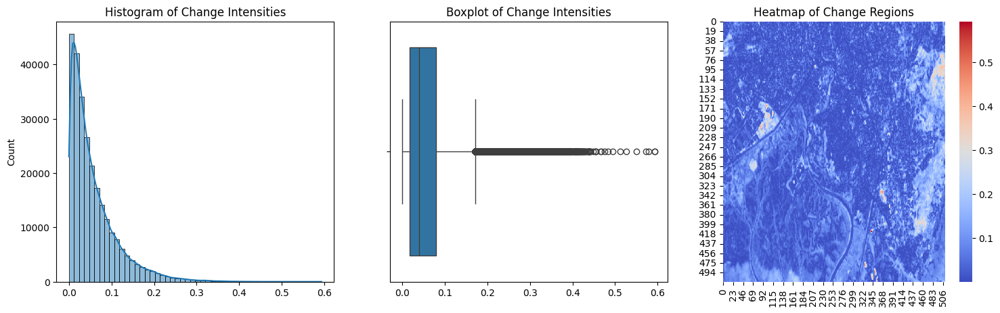

In [ ]:
before_paths = ['a1.tif', 'a2.tif', 'a3.tif', 'a4.tif', 'a5.tif', 'a6.tif', 'a7.tif', 'a8.tif', 'a9.tif', 'a10.tif', 'a11.tif', 'a12.tif', 'a13.tif']
after_paths = ['b1.tif', 'b2.tif', 'b3.tif', 'b4.tif', 'b5.tif', 'b6.tif', 'b7.tif', 'b8.tif', 'b9.tif', 'b10.tif', 'b11.tif', 'b12.tif', 'b13.tif']

# Load images
before_images = load_and_resize_images(before_paths)
after_images = load_and_resize_images(after_paths)

# Compute change maps and apply thresholding
for i in range(len(before_images)):
    print(f"Processing Image Pair {i+1}/{len(before_images)}")

    # Compute change map
    change_map = compute_change_map(before_images[i], after_images[i])

    # Apply thresholding
    binary_map, adaptive_map = apply_thresholding(change_map)

    # Visualize results
    visualize_change(before_images[i], after_images[i], change_map, binary_map, adaptive_map, title=f"Change Detection {i+1}")

    # Generate statistical visualizations
    plot_statistics(change_map)


In [ ]:
import tifffile as tiff

for i in range(len(before_images)):
    print(f"Processing Image Pair {i+1}/{len(before_images)}")

    output_filename = f"binary_map_{i+1}.tif"
    tiff.imwrite(output_filename, binary_map)

Processing Image Pair 1/13
Processing Image Pair 2/13
Processing Image Pair 3/13
Processing Image Pair 4/13
Processing Image Pair 5/13
Processing Image Pair 6/13
Processing Image Pair 7/13
Processing Image Pair 8/13
Processing Image Pair 9/13
Processing Image Pair 10/13
Processing Image Pair 11/13
Processing Image Pair 12/13
Processing Image Pair 13/13
